In [4]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/uber-pickups-in-new-york-city/uber-raw-data-may14.csv
/kaggle/input/uber-pickups-in-new-york-city/other-FHV-services_jan-aug-2015.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Prestige_B01338.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Firstclass_B01536.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Skyline_B00111.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Lyft_B02510.csv
/kaggle/input/uber-pickups-in-new-york-city/uber-raw-data-apr14.csv
/kaggle/input/uber-pickups-in-new-york-city/uber-raw-data-jul14.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Dial7_B00887.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Diplo_B01196.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Federal_02216.csv
/kaggle/input/uber-pickups-in-new-york-city/Uber-Jan-Feb-FOIL.csv
/kaggle/input/uber-pickups-in-new-york-city/uber-raw-data-jun14.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Highclass_B01717.csv
/kaggle/input/uber-pickups-in-ne

Load Data

In [5]:
uber = pd.read_csv("/kaggle/input/uber-pickups-in-new-york-city/uber-raw-data-janjune-15.csv")

In [6]:
uber.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


Features explanation:

Dispatching_base_num: is a feature for a number or code that identifies the base or dispatch station from which an Uber driver operates. Each base has a different code.

Pickup_Date: is a feature for the date and time when the Uber driver picks up the customer.

Affiliated_base_num: is a feature for a number or code that identifies the affiliate base associated with the trip.

locationID: is a feature to code or identify the location of the pick-up point or destination in an Uber trip.

In [7]:
uber.shape

(14270479, 4)

Data Preprocessing (Transform)

In [8]:
#handling duplicates
if uber.duplicated().any():
    print(f"there are {uber.duplicated().sum()} duplicates data")
else: 
    print("there are no duplicates data")

there are 898225 duplicates data


In [9]:
uber.drop_duplicates(inplace=True)

In [10]:
#check again after removing
if uber.duplicated().any():
    print(f"there are {uber.duplicated().sum()} duplicates data")
else: 
    print("there are no duplicates data")

there are no duplicates data


In [11]:
uber.shape

(13372254, 4)

In [12]:
uber.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [13]:
#detectin columns that have missing values
missing_values = uber.isnull().sum()
missing_values= missing_values[missing_values > 0]

if not missing_values.empty:
    print("Columns with missing values")
    for column, count in missing_values.items():
        print(f"In {column} there are {count} missing values")
else:
    print("There are no columns with missing values")

Columns with missing values
In Affiliated_base_num there are 160702 missing values


In [14]:
uber = uber.dropna()

In [15]:
#check again after removing
missing_values = uber.isnull().sum()

# Display columns with missing values and the count of missing values
missing_values = missing_values[missing_values > 0]

if not missing_values.empty:
    print("Columns with missing values:")
    for column, count in missing_values.items():
        print(f"{column}: {count} missing values")
else:
    print("There are no columns with missing value")

There are no columns with missing value


In [16]:
uber.shape

(13211552, 4)

Incorrect Data Types

In [17]:
uber.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [18]:
# User input for column name
column_name = "Pickup_date"

# Check if the column name entered by the user exists in the DataFrame
if column_name in uber.columns:
    data_type = type(uber[column_name][0])
    print(f"In the column '{column_name}', the data type is {data_type}.")
else:
    print(f"Column with name '{column_name}' was not found in the DataFrame.")

In the column 'Pickup_date', the data type is <class 'str'>.


In [19]:
uber.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [20]:
#changin Pickup_date data type
uber["Pickup_date"] = pd.to_datetime(uber["Pickup_date"])

In [21]:
# Checking again after transformation
column_name = "Pickup_date"

# Check if the column name entered by the user exists in the DataFrame
if column_name in uber.columns:
    data_type = type(uber[column_name][0])
    print(f"In the column '{column_name}', the data type is {data_type}.")
else:
    print(f"Column with name '{column_name}' was not found in the DataFrame.")

In the column 'Pickup_date', the data type is <class 'pandas._libs.tslibs.timestamps.Timestamp'>.


Analysing the Data

In [22]:
uber["month"] = uber["Pickup_date"].dt.month_name()
uber["month"].value_counts()

month
June        2571771
May         2483980
February    2141306
April       2112705
March       2062639
January     1839151
Name: count, dtype: int64

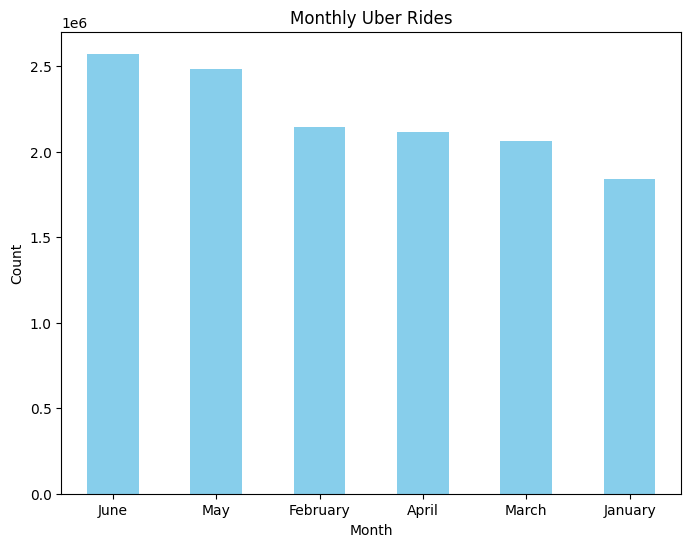

In [23]:
import matplotlib.pyplot as plt
counts = uber["month"].value_counts()
plt.figure(figsize=(8,6))
counts.plot(kind="bar",color="skyblue")
plt.xlabel("Month")
plt.ylabel("Count")
plt.title("Monthly Uber Rides")
plt.xticks(rotation = 0)
plt.show()

Result

The highest Uber pickups in New York City were in June.

Which weekday of the month has maximum Uber pickups in New York City?

In [24]:
uber["Weekday"] = uber["Pickup_date"].dt.day_name()
uber["Weekday"].value_counts()

Weekday
Saturday     2227660
Friday       2111389
Thursday     1985749
Sunday       1816566
Wednesday    1751009
Tuesday      1732528
Monday       1586651
Name: count, dtype: int64

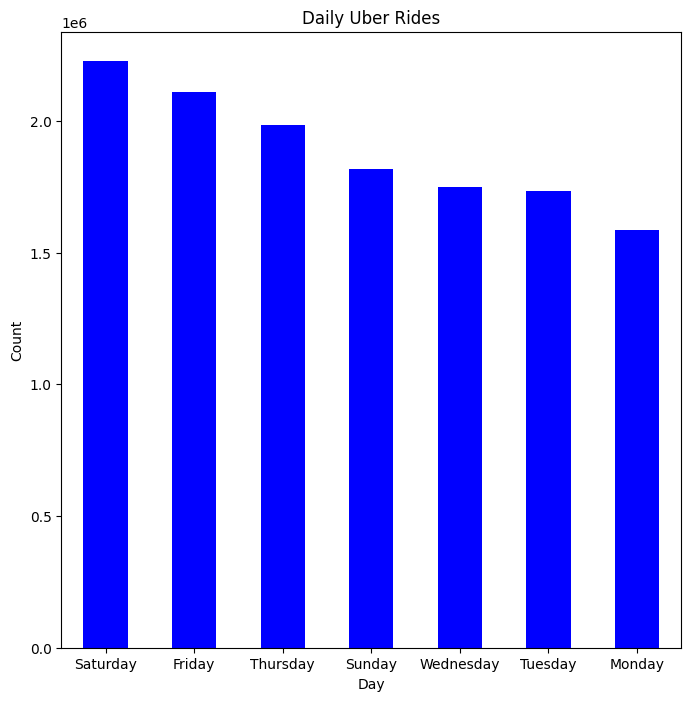

In [25]:
day_counts = uber["Weekday"].value_counts()
plt.figure(figsize=(8,8))
day_counts.plot(kind="bar",color="blue")
plt.xlabel("Day")
plt.ylabel("Count")
plt.title("Daily Uber Rides")
plt.xticks(rotation = 0)
plt.show()

In [26]:
pivot = pd.crosstab(index=uber["month"],columns=uber["Weekday"])
pivot

Weekday,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
month,,,,,,,
April,315002,238429,324545,273560,372522,250632,338015
February,360136,264693,354962,284432,323955,276956,276172
January,325261,182785,369693,219884,316857,188802,235869
June,371225,375312,399377,334434,357782,405500,328141
March,309631,269931,314785,313865,277026,320634,256767
May,430134,255501,464298,390391,337607,290004,316045


<Figure size 800x600 with 0 Axes>

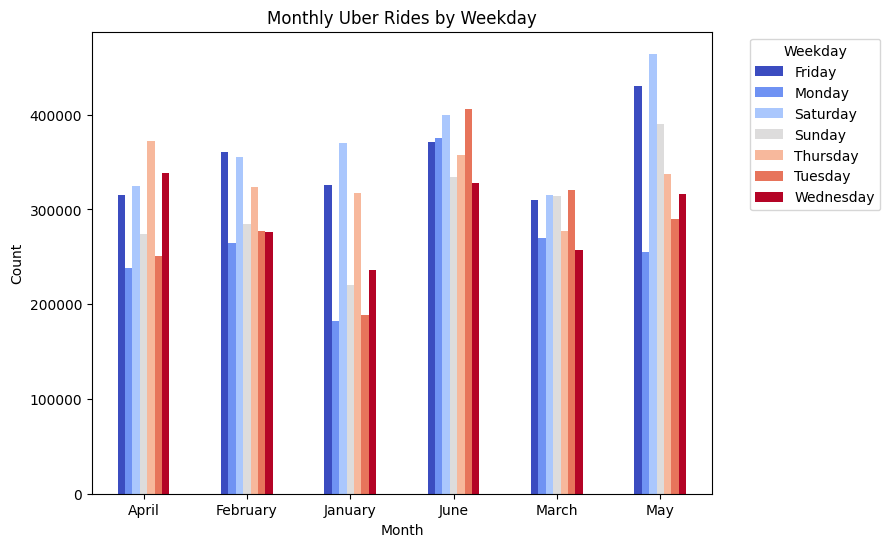

In [27]:
plt.figure(figsize=(8, 6))
pivot.plot(kind="bar", figsize=(8, 6), cmap="coolwarm")
plt.xlabel("Month")
plt.ylabel("Count")
plt.title("Monthly Uber Rides by Weekday") 
plt.xticks(rotation=0)  # Set X-axis label rotation
plt.legend(title="Weekday", bbox_to_anchor=(1.05, 1), loc='upper left')  # Add legend
plt.show()


Result

In January, February and May the highest pickups are on Fridays and Saturdays. In March and June, the highest pickups are on Tuesdays. And in April the highest pick-up was on Thursday.


What times are the busiest for Uber pickup in New York City?

In [28]:
uber["hour"] = uber["Pickup_date"].dt.hour

In [29]:
summary = uber.groupby(["Weekday", "hour"],as_index=False).size()
summary

,Weekday,hour,size
0,Friday,0,78936
1,Friday,1,44064
2,Friday,2,26942
3,Friday,3,18845
4,Friday,4,22798
...,...,...,...
163,Wednesday,19,129724
164,Wednesday,20,122022
165,Wednesday,21,119511
166,Wednesday,22,113909


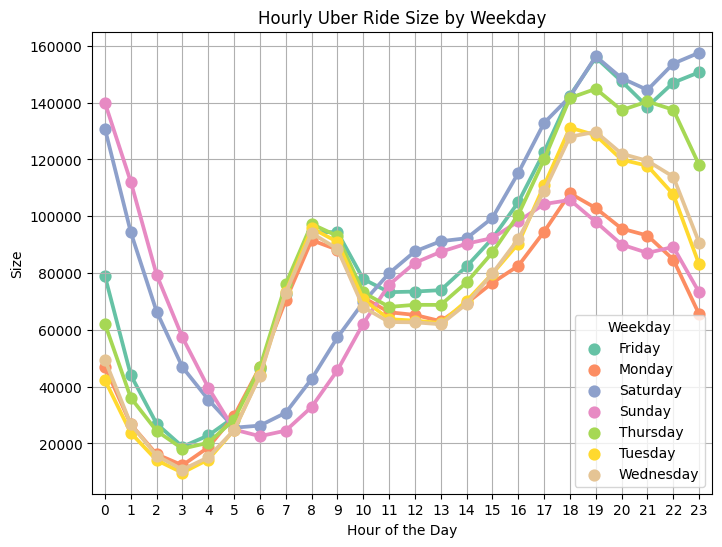

In [30]:
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.pointplot(x="hour", y="size", hue="Weekday", data=summary, palette="Set2")

plt.xlabel("Hour of the Day")
plt.ylabel("Size")
plt.title("Hourly Uber Ride Size by Weekday")

plt.legend(title="Weekday")
plt.grid(True)  # Add grid lines
plt.show()

Result

On Fridays and Saturdays, precisely at 19:00, Uber pickups are highest. This is probably because people are leaving to enjoy their weekend evening, because the next day they have a holiday from work. Apart from that on the same day at 23:00, it also has the highest uber pickup. This is probably because people go home and rest.

There are interesting patterns on Saturday and Sunday. If we observe, at 00:00 - 15:00, it has the same pickup pattern. However, after 15:00 - 23:00 it shows a reverse pattern. This is because people use Sundays to gather with family or rest because they work on Mondays.

Which Base Number has the highest number of active vehicles??

In [31]:
uber_foil = pd.read_csv("/kaggle/input/uber-pickups-in-new-york-city/Uber-Jan-Feb-FOIL.csv")

In [32]:
uber_foil.head(5)

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


Features explanation:

Dispatching_base_num: is a feature for a number or code that identifies the base or dispatch station from which an Uber driver operates. Each base has a different code.

Date: is a Feature used to identify the specific date on which Uber operating data was collected or recorded.

Active_vehicles: is a feature used to record the number of active vehicles available in the Uber system on a certain date. This feature reflects the number of vehicles ready to be used to serve passengers on that day.

Trips: is a feature used to record the total number of trips made by Uber drivers on a certain date. This feature reflects how many trips have been completed that day. This is an important indicator to see the level of Uber activity in a region at any given time.

In [33]:
uber_foil.shape

(354, 4)

In [34]:
from plotly.offline import init_notebook_mode

init_notebook_mode(connected=True)

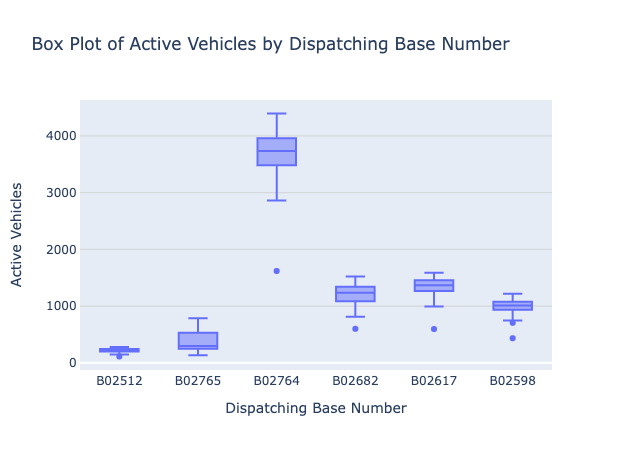

In [35]:
import plotly.express as px

fig = px.box(
    x='dispatching_base_number',
    y='active_vehicles',
    data_frame=uber_foil,
    title="Box Plot of Active Vehicles by Dispatching Base Number",
    labels={'dispatching_base_number': 'Dispatching Base Number', 'active_vehicles': 'Active Vehicles'}
)

# Customize the layout
fig.update_layout(
    xaxis=dict(showline=True, showgrid=False),
    yaxis=dict(showline=True, showgrid=True, gridcolor='lightgray'),
)

# Show the plot
fig.show()

/opt/conda/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



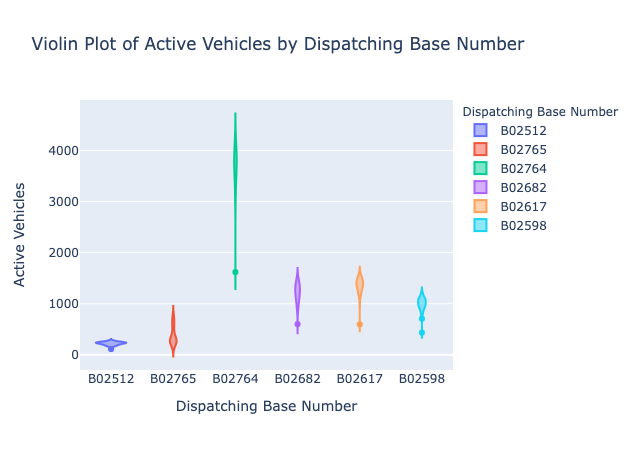

In [36]:
fig = px.violin(
    x='dispatching_base_number',
    y='active_vehicles',
    data_frame=uber_foil,
    title="Violin Plot of Active Vehicles by Dispatching Base Number",
    labels={'dispatching_base_number': 'Dispatching Base Number', 'active_vehicles': 'Active Vehicles'},
    color='dispatching_base_number'
)

# Show the plot
fig.show()

result

From the boxplot results, it shows that the most active vehicles are in the base number B02764

Let's collect all the data

In [37]:
import os

files=os.listdir(r"/kaggle/input/uber-pickups-in-new-york-city")
files

['uber-raw-data-may14.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Prestige_B01338.csv',
 'other-Firstclass_B01536.csv',
 'other-Skyline_B00111.csv',
 'other-Lyft_B02510.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-jul14.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-jun14.csv',
 'other-Highclass_B01717.csv',
 'other-American_B01362.csv',
 'uber-raw-data-sep14.csv',
 'uber-raw-data-aug14.csv',
 'other-Carmel_B00256.csv',
 'uber-raw-data-janjune-15.csv']

In [38]:
files.remove('other-FHV-services_jan-aug-2015.csv')
files.remove('other-Prestige_B01338.csv')
files.remove('other-Firstclass_B01536.csv')
files.remove('other-Skyline_B00111.csv')
files.remove('other-Lyft_B02510.csv')
files.remove('other-Dial7_B00887.csv')
files.remove('other-Diplo_B01196.csv')
files.remove('other-Federal_02216.csv')
files.remove('Uber-Jan-Feb-FOIL.csv')
files.remove('other-Highclass_B01717.csv')
files.remove('other-American_B01362.csv')
files.remove('other-Carmel_B00256.csv')
files.remove('uber-raw-data-janjune-15.csv')

In [39]:
files

['uber-raw-data-may14.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-sep14.csv',
 'uber-raw-data-aug14.csv']

In [40]:
final = pd.DataFrame()
path = r"/kaggle/input/uber-pickups-in-new-york-city"
for file in files:
    current_df = pd.read_csv(path+'/'+file)
    final = pd.concat([current_df, final])

In [41]:
final.shape

(4534327, 4)

In [42]:
#Check for duplicates
if final.duplicated().any():
    print(f"there ara as many as {final.duplicated().sum()} duplicated data")
else:
    print("there are no duplicated data")

there ara as many as 82581 duplicated data


In [43]:
final.drop_duplicates(inplace=True)

In [44]:
#Check for duplicates again
if final.duplicated().any():
    print(f"there ara as many as {final.duplicated().sum()} duplicated data")
else:
    print("there are no duplicated data")

there are no duplicated data


In [45]:
final.shape

(4451746, 4)

In [46]:
final.head()

,Date/Time,Lat,Lon,Base
0,8/1/2014 0:03:00,40.7366,-73.9906,B02512
1,8/1/2014 0:09:00,40.7260,-73.9918,B02512
2,8/1/2014 0:12:00,40.7209,-74.0507,B02512
3,8/1/2014 0:12:00,40.7387,-73.9856,B02512
4,8/1/2014 0:12:00,40.7323,-74.0077,B02512


Features explanation:

**Date/Time**: is a feature that includes information about specific dates and times in the Uber dataset. This feature is used to identify when a particular Uber trip starts or ends.

**Lat**: is a feature that contains the latitude coordinates of the pick-up location or other relevant locations in the Uber trip. Latitude coordinates are measurements that indicate the north or south position of a point on the Earth.

**Lon**: is a feature that contains the longitude coordinates of the pick-up location or other relevant locations in the Uber trip. Longitude coordinates are measurements that indicate the east or west position of a point on Earth.

**Base**: is a feature that includes information about a specific base or dispatch station associated with an Uber trip. These bases are locations where Uber drivers may operate or be based. Each base has a different code or name.

What is the busiest Uber pickup location in New York City?

In [47]:
uber_rush = final.groupby(["Lat","Lon"], as_index=False).size()
uber_rush

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1
...,...,...,...
574553,41.3730,-72.9237,1
574554,41.3737,-73.7988,1
574555,41.5016,-72.8987,1
574556,41.5276,-72.7734,1


In [48]:
import folium
from folium.plugins import HeatMap
basemap = folium.Map()
HeatMap(uber_rush).add_to(basemap)

In [49]:
basemap

How busy are the hours and weekdays? (pair wise analysis)

In [50]:
final.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [51]:
final['Date/Time'][0]

0    8/1/2014 0:03:00
0    9/1/2014 0:01:00
0    6/1/2014 0:00:00
0    7/1/2014 0:03:00
0    4/1/2014 0:11:00
0    5/1/2014 0:02:00
Name: Date/Time, dtype: object

The output above, when calling index [0] which should have produced 1 row, instead produced 6. This is because the 6 datasets were combined.

In [52]:
final['Date/Time'] = pd.to_datetime(final['Date/Time'], format="%m/%d/%Y %H:%M:%S")

In [53]:
final['Date/Time'].dtype

dtype('<M8[ns]')

In [54]:
final['day'] = final['Date/Time'].dt.day
final['hour'] = final['Date/Time'].dt.hour

In [55]:
def gen_pivot_table(df, col1, col2):
    pivot = final.groupby(['day', 'hour']).size().unstack()
    return pivot.style.background_gradient()

In [56]:
gen_pivot_table(final, 'day', 'hour')

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203


In [57]:
final.head(100)

,Date/Time,Lat,Lon,Base,day,hour
0,2014-08-01 00:03:00,40.7366,-73.9906,B02512,1,0
1,2014-08-01 00:09:00,40.7260,-73.9918,B02512,1,0
2,2014-08-01 00:12:00,40.7209,-74.0507,B02512,1,0
3,2014-08-01 00:12:00,40.7387,-73.9856,B02512,1,0
4,2014-08-01 00:12:00,40.7323,-74.0077,B02512,1,0
...,...,...,...,...,...,...
98,2014-08-01 06:02:00,40.7244,-73.9787,B02512,1,6
99,2014-08-01 06:04:00,40.7638,-73.9639,B02512,1,6
100,2014-08-01 06:04:00,40.7566,-73.9654,B02512,1,6
101,2014-08-01 06:07:00,40.7276,-73.9959,B02512,1,6


In [58]:
final.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
day                   int32
hour                  int32
dtype: object

In [59]:
final['Date'] = pd.to_datetime(final['Date/Time']).dt.date
final['Time'] = pd.to_datetime(final['Date/Time']).dt.time

In [60]:
final.head()

,Date/Time,Lat,Lon,Base,day,hour,Date,Time
0,2014-08-01 00:03:00,40.7366,-73.9906,B02512,1,0,2014-08-01,00:03:00
1,2014-08-01 00:09:00,40.7260,-73.9918,B02512,1,0,2014-08-01,00:09:00
2,2014-08-01 00:12:00,40.7209,-74.0507,B02512,1,0,2014-08-01,00:12:00
3,2014-08-01 00:12:00,40.7387,-73.9856,B02512,1,0,2014-08-01,00:12:00
4,2014-08-01 00:12:00,40.7323,-74.0077,B02512,1,0,2014-08-01,00:12:00


In [61]:
counts_dates = final["Date/Time"].value_counts()
counts_dates

Date/Time
2014-04-07 20:21:00    97
2014-06-13 18:03:00    85
2014-04-07 20:22:00    83
2014-09-13 18:44:00    78
2014-07-15 19:25:00    77
                       ..
2014-04-23 01:38:00     1
2014-04-23 01:40:00     1
2014-04-23 01:43:00     1
2014-04-23 01:53:00     1
2014-05-31 04:03:00     1
Name: count, Length: 260093, dtype: int64

In [62]:
summary2 = final.groupby(["Base","Date","hour"],as_index=False).size()
summary2

,Base,Date,hour,size
0,B02512,2014-04-01,0,9
1,B02512,2014-04-01,1,4
2,B02512,2014-04-01,2,4
3,B02512,2014-04-01,3,4
4,B02512,2014-04-01,4,9
...,...,...,...,...
21847,B02764,2014-09-30,18,569
21848,B02764,2014-09-30,19,546
21849,B02764,2014-09-30,20,483
21850,B02764,2014-09-30,21,422


In [63]:
summary2.to_csv("UberPickupsSummary.csv")

# **Part II : Poisson Regression**

In [64]:
# get the data
# transform days values to a range of integers
# transform the hours to one hot encoding 
# tansform the days to a label encoding
# introduce GLM theory
# fit a glm model to the data
# explain the results 
    # explain the p-values of the z-scores
    # explain the deviance test 
    # explain the goodness of fit test
# interpret the coefficients 
# plot the coefficents as a function of the hour and Base
# plot the counts and the predicted values Lambda against the days 
# plot a the Pearson residual against the fitted values
# identify the outliers and the points with high leverage and remove them
# identify what transformed version of the model can make the fit any better if the relationship is not linear
# do a bootstapping validation
    # for every version of the model :
        # fit the model onto 30 resampled subsets
        # get statistics like goodness of fit test values of all the 30 fits
        # draw a box plot of the values 

# make a conclusion about the best model

# fit a deep learning model
# calculate a goodness of fit of deep model


$$\documentclass{article}
\begin{document}
Hello World!
\end{document}$$

In [65]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
Uber = pd.read_csv('/kaggle/working/UberPickupsSummary.csv')
Uber = Uber.drop(columns=['Unnamed: 0'])
Uber

,Base,Date,hour,size
0,B02512,2014-04-01,0,9
1,B02512,2014-04-01,1,4
2,B02512,2014-04-01,2,4
3,B02512,2014-04-01,3,4
4,B02512,2014-04-01,4,9
...,...,...,...,...
21847,B02764,2014-09-30,18,569
21848,B02764,2014-09-30,19,546
21849,B02764,2014-09-30,20,483
21850,B02764,2014-09-30,21,422


In [66]:
encoded_labels, unique_values = pd.factorize(Uber['Date'])
Uber['Date'] = encoded_labels
Uber

,Base,Date,hour,size
0,B02512,0,0,9
1,B02512,0,1,4
2,B02512,0,2,4
3,B02512,0,3,4
4,B02512,0,4,9
...,...,...,...,...
21847,B02764,182,18,569
21848,B02764,182,19,546
21849,B02764,182,20,483
21850,B02764,182,21,422


In [67]:
Uber = pd.get_dummies(Uber, columns=['Base', 'hour']).drop(columns=['hour_0', 'Base_B02512'])
Uber['intercept'] = [1]*len(Uber)
Uber


,Date,size,Base_B02598,Base_B02617,Base_B02682,Base_B02764,hour_1,hour_2,hour_3,hour_4,...,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,intercept
0,0,9,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,1
1,0,4,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,1
2,0,4,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,1
3,0,4,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,1
4,0,9,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21847,182,569,False,False,False,True,False,False,False,False,...,False,False,False,True,False,False,False,False,False,1
21848,182,546,False,False,False,True,False,False,False,False,...,False,False,False,False,True,False,False,False,False,1
21849,182,483,False,False,False,True,False,False,False,False,...,False,False,False,False,False,True,False,False,False,1
21850,182,422,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,1


# An introduction to Generalize linear models Theorie

In simple linear regression , we regress the dependent variable Y onto the predictors X , using the formula $Y = X.\beta + \epsilon$ , such that Y is real number vector that follow as normal distribution $N(\mu,\sigma)$ and $\beta$ is the coefficients vector that we try to find by minimizing the the error vector $\epsilon$ using Least squares method, thus making the predicted values $X.\beta$ as close as possible to the real Y (i.e $Y \approx X.\beta$ ). 

Sounds great!, it turned out that this method doesn't work well when Y in not real number, this means that Y doesn't follow the normal distribution discribed above, so what can we do ? . To solve this problem we need go a step back to the linear regression problem and make small clarification that we will take as a starting point for our startegie.

When we said that $Y \approx X.\beta$ that was not precise enough,  in reality the correct formula should be $\mu = E[Y|X] \approx X.\beta$
this means that not every point Y is linear with the predictors X , but more precisely it is the conditional mean of Y for each value of X that should be in a linear relationship with X

With that being clarified,  we can start discovering the theoey of Generalized Linear Model "GLM"

**1. Modeling the probability distribution:**
When Y doesn't follow a normal distribution , we need first to figure what distribution it follows , one case is the classification problem where   $Y$ ~ $Bernoulli(p)$, where p is the mean of the distribution, using the idea discribed above about relationship of the mean and the predictors , instead of modeling $Y \approx X.\beta$, we can model 
$p \approx X.\beta$ , but $0 \leq p \leq 1$ ,which means we'll have some problems when modeling it with $X.\beta$  that ranges in $[-\infty, +\infty]$ , so we need to transforme p (or $X.\beta$) so that both sides of the equation can only have values from the same range, and then we model that tranformation as $$transform(p) \approx X.\beta$$.
The tranformation that is used in the classification problem is the one that is known as the **logit** tranformation
$$logit(p) = \log{\frac{p}{1-p}}$$


In [68]:
Uber = Uber.astype(np.float32)
Uber

,Date,size,Base_B02598,Base_B02617,Base_B02682,Base_B02764,hour_1,hour_2,hour_3,hour_4,...,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,intercept
0,0.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,4.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,4.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21847,182.0,569.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
21848,182.0,546.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
21849,182.0,483.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
21850,182.0,422.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


In [69]:
y = Uber['size']
X = Uber.drop(columns=['size'])
model = sm.GLM(y, X, family = sm.families.Poisson())
results = model.fit()
print(results.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                   size   No. Observations:                21852
Model:                            GLM   Df Residuals:                    21847
Model Family:                 Poisson   Df Model:                            4
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -6.3908e+05
Date:                Wed, 17 Apr 2024   Deviance:                   1.1382e+06
Time:                        09:50:10   Pearson chi2:                 1.29e+06
No. Iterations:                     6   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Date            0.0036   9.07e-06    398.572      

# Explaining the test results

**1. The Deviance Test:**
The deviance test is analoguous to the F-test in linear regression
The very high values of the deviance $(1.1402*10^6)$ indicates that thers is enough eivdances to reject null hypothesis that $\beta = 0$ and accept the alternative that says that at least one of the coefficents is significantly different than zero


**2. The Z-test:**
The p-values of the z-scores are all lower than $5%$ Which shows that all the coefficents are significantly different than zero

**3. The Pearson $\chi^2$-test:**
This the goodness of fit test that tests how well the actual counts fit the predicted probabilities. $1.30*10^6$ is a large values for this test showing that there is a significant fit between the predicted probabilites and the actual Poisson count random variables in the columns 'size'


# Interpreting the Coefficients

We should be careful when interpreting the results, because an interpretation can differ when the coefficient of a categorical feature from when the feature has real values 

1. Coefficient of date feature:
the date feature in this dataset is an integer value tha can range from $0$ to $+\infty$ which means that our interpretation of the coefficient will the same as we do with a real values feature , in this case we can that $\beta_Date = 0.0036$ means that for every one day step to the future we expect an addition of approximitly 0.0036 in $E[Size]$ the expected value of  

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



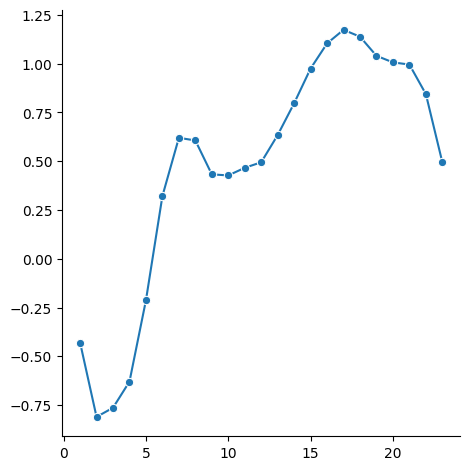

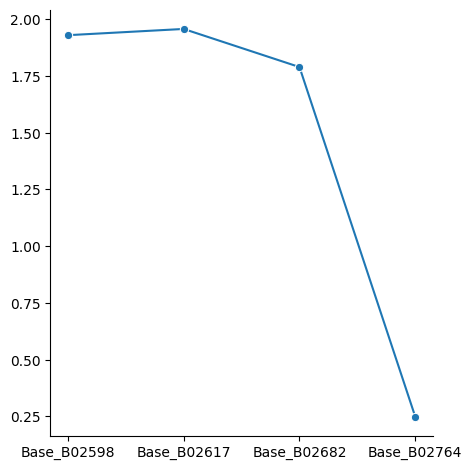

In [70]:
columns = ['hour_'+str(i) for i in range(1,24)]
hour_coefs = results.params[columns]
sns.relplot(x = range(1,24), y= hour_coefs.values, kind='line', marker='o')

# axes[0].xlabel('hours')
# axes[0].ylabel('Coefficients')
columns = ["Base_B02598", "Base_B02617", "Base_B02682", "Base_B02764"]
Base_coefs = results.params[columns]
sns.relplot(x = columns, y= Base_coefs.values, kind='line', marker='o')
# axes[1].set_xlabel('Bases')
# axes[1].set_ylabel('Coefficients')

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



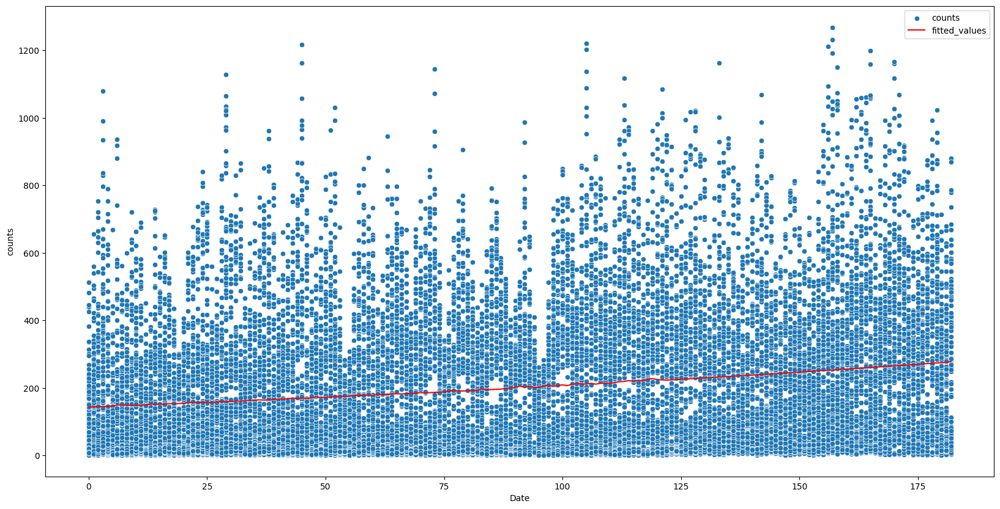

In [71]:
# print()
data = pd.DataFrame(results.fittedvalues, columns=['fitted_values'])
data['Date'] = X['Date']
data['counts'] = y.values
# print(data)
fig, ax = plt.subplots(figsize=(20,10))
sns.scatterplot(data = data, x = 'Date', y='counts',ax=ax, label='counts')
data_grouped = data.groupby(by='Date').mean()
sns.lineplot(data = data_grouped, x='Date', y='fitted_values',ax=ax ,color='r', label='fitted_values')
plt.legend()
# fitted_vals
# counts = y.values
# days = X['date'].values
# sns.relplot(x =days, y = counts)
# sns.relplot(x = fitted)

<bound method Axes.axline of <Axes: xlabel='fitted_values', ylabel='residual'>>

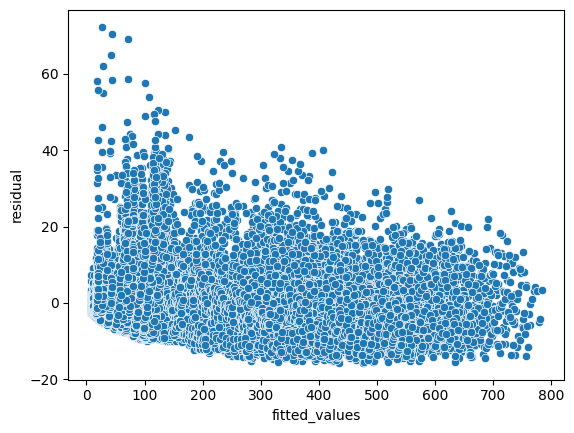

In [72]:

resid = (data['counts'] - data['fitted_values'])/np.sqrt(data['fitted_values'])
fig, ax = plt.subplots()
sns.set_theme()
sns.scatterplot(x= data['fitted_values'], y= resid, ax=ax)
ax.set_xlabel('fitted_values')
ax.set_ylabel('residual')
ax.axline

In [73]:
y = Uber['size']
X2 = Uber.drop(columns=['size'])
X2['Date_2'] = np.square(X2['Date'])
model2 = sm.GLM(y, X2, family = sm.families.Poisson())
results2 = model2.fit()
print(results2.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                   size   No. Observations:                21852
Model:                            GLM   Df Residuals:                    21851
Model Family:                 Poisson   Df Model:                            0
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -6.3788e+05
Date:                Wed, 17 Apr 2024   Deviance:                   1.1358e+06
Time:                        09:50:12   Pearson chi2:                 1.28e+06
No. Iterations:                     6   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Date            0.0018   3.72e-05     49.343      

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



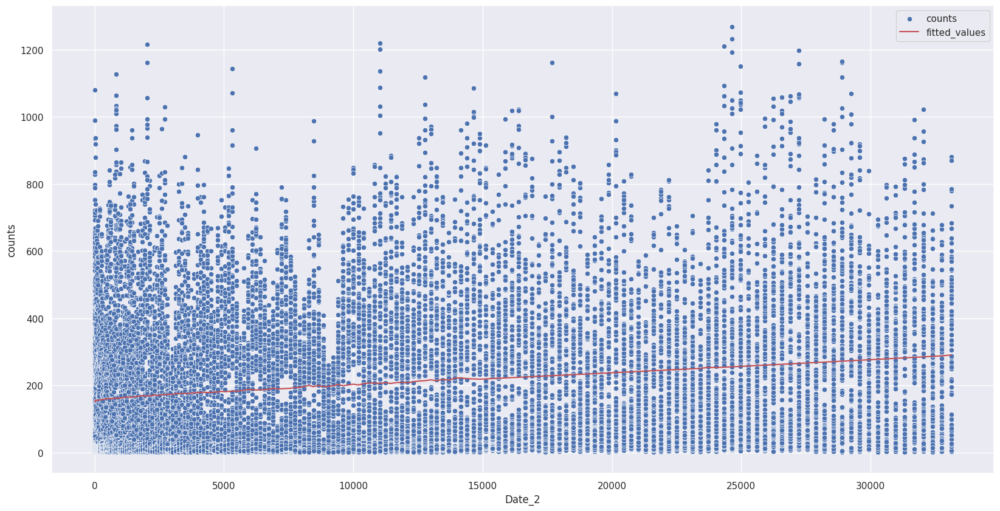

In [74]:
data = pd.DataFrame(results2.fittedvalues, columns=['fitted_values'])
data['Date_2'] = X2['Date_2']
data['counts'] = y.values
# print(data)
fig, ax = plt.subplots(figsize=(20,10))
sns.scatterplot(data = data, x = 'Date_2', y='counts',ax=ax, label='counts')
data_grouped = data.groupby(by='Date_2').mean()
sns.lineplot(data = data_grouped, x='Date_2', y='fitted_values',ax=ax ,color='r', label='fitted_values')
plt.legend()

In [ ]:
# algorithm
# models_list = [xgboost.XGRegressor, deepNN, SVR, GLM.poisson, KNN(1), KNN(k)]
# train each model on the train set
# generate 30 sample from the test set using bootstrapping 
# test each model in the model list on the 30 samples
# calculate the average chi2 square metric for each model's prediction
# drow a box plot of the calculated chi2 values 
# choose the best model

# Fittin Deep Learning model

In [75]:
import tensorflow as tf
from sklearn.preprocessing import StandardScaler

2024-04-17 09:50:15.786331: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-17 09:50:15.786499: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-17 09:50:15.947842: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [76]:
input_data = Uber.values
scaler = StandardScaler()
input_data = scaler.fit_transform(input_data)
output_data = tf.constant(y.values, dtype=tf.float32)

In [77]:
deep_model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1, activation='exponential')
])


In [78]:
class PearsonGoodnessOfFit(tf.keras.metrics.Metric):
    def __init__(self, name='binary_true_positives', **kwargs):
        super().__init__(name=name, **kwargs)
        self.pearson_goodness_of_fit = self.add_weight(
            shape=(),
            initializer='zeros',
            name='pearson_goodness_of_fit'
        )

    def update_state(self, y_true, y_pred, sample_weight=None):
        

        if sample_weight is not None:
            pass
#             sample_weight = ops.cast(sample_weight, self.dtype)
#             sample_weight = ops.broadcast_to(
#                 sample_weight, ops.shape(values)
#             )
        self.pearson_goodness_of_fit.assign(tf.reduce_mean(tf.square(y_true - y_pred)/y_pred))

    def result(self):
        return self.pearson_goodness_of_fit

In [79]:
deep_model.compile(
    loss = tf.keras.losses.Poisson(),
    metrics = PearsonGoodnessOfFit(),
    optimizer = tf.keras.optimizers.Adam()
)

In [2]:
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
import statsmodels.api as sm

models_list = [deep_model, 
               SVR(), 
               KNeighborsRegressor(n_neighbors=1),
               KNeighborsRegressor(n_neighbors=5)]
               
#                sm.GLM(train_y, train_X, family = sm.families.Poisson()) ]

for model in models_list:
    model.fit(train_X,train_y)
    

test_sets_X, test_sets_y = generate_samples(test_x, test_y, 30)

scores = []
for model in models_list:
    scm = []
    for i in range(test_sets_X.shape[0]):
        y_pred = model.predict(test_set_X[i])
        ssm.append(chi2_score(y_pred, test_sets_y[i]))
        
    scores.append(scm)

In [80]:

deep_model.fit(input_data, output_data, epochs=10)

Epoch 1/10
683/683 [==============================] - 2s 2ms/step - loss: -829.7887 - binary_true_positives: 21.1100
Epoch 2/10
683/683 [==============================] - 2s 2ms/step - loss: -969.8799 - binary_true_positives: 9.2051
Epoch 3/10
683/683 [==============================] - 1s 2ms/step - loss: -975.4977 - binary_true_positives: 7.7768
Epoch 4/10
683/683 [==============================] - 1s 2ms/step - loss: -977.3027 - binary_true_positives: 1.9991
Epoch 5/10
683/683 [==============================] - 1s 2ms/step - loss: -977.9141 - binary_true_positives: 1.6627
Epoch 6/10
683/683 [==============================] - 1s 2ms/step - loss: -978.2690 - binary_true_positives: 2.5324
Epoch 7/10
683/683 [==============================] - 1s 2ms/step - loss: -978.4626 - binary_true_positives: 1.2556
Epoch 8/10
683/683 [==============================] - 1s 2ms/step - loss: -978.5884 - binary_true_positives: 1.2345
Epoch 9/10
683/683 [==============================] - 1s 2ms/step - los

In [ ]:
# kjkl